In [1]:
# переключиться на полуточную арифметику (float16)
import tensorflow as tf
from tensorflow.keras.mixed_precision import Policy
policy = Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

2025-10-21 12:35:12.633250: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-21 12:35:12.641942: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761039312.650303   11221 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761039312.653069   11221 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1761039312.660297   11221 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [3]:
# 🔥 САМАЯ БЫСТРАЯ ОЧИСТКА (копируй и запускай)
import tensorflow as tf
import gc
tf.keras.backend.clear_session()
gc.collect()
print("✅ GPU память очищена!")

# 📊 ПРОВЕРИТЬ ПАМЯТЬ
def quick_gpu_check():
    gpus = tf.config.list_physical_devices('GPU')
    print(f"🎯 Активно GPU: {len(gpus)}")
quick_gpu_check()

✅ GPU память очищена!
🎯 Активно GPU: 1


In [ ]:
#!pip install tensorboard

In [3]:
#!pip install scikit-optimize -q

In [2]:
#!pip install optuna -q

In [21]:
#!pip install optuna-integration[tfkeras] -q

In [26]:
#!pip install optuna-dashboard -q

In [52]:
#!pip install autokeras --upgrade --force-reinstall -q

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mediapipe 0.10.21 requires numpy<2, but you have numpy 2.1.3 which is incompatible.
mediapipe 0.10.21 requires protobuf<5,>=4.25.3, but you have protobuf 5.29.5 which is incompatible.
super-gradients 3.7.1 requires numpy<=1.23, but you have numpy 2.1.3 which is incompatible.
super-gradients 3.7.1 requires protobuf==3.20.3, but you have protobuf 5.29.5 which is incompatible.
super-gradients 3.7.1 requires termcolor==1.1.0, but you have termcolor 3.1.0 which is incompatible.
tf-keras 2.20.1 requires tensorflow<2.21,>=2.20, but you have tensorflow 2.19.1 which is incompatible.


In [ ]:
# Оптимизация TensorFlow
import tensorflow as tf
tf.config.optimizer.set_jit(True)  # Включение XLA-компиляции
tf.config.threading.set_intra_op_parallelism_threads(8)
#tf.config.threading.set_inter_op_parallelism_threads(8)

# Для GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            #tf.config.experimental.set_memory_limit(gpu, 8192)  # Лимит 8GB
    except RuntimeError as e:
        print(e)

In [3]:
!nvidia-smi

Mon Oct 20 15:22:46 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.64.01              Driver Version: 576.80         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070        On  |   00000000:01:00.0 Off |                  N/A |
|  0%   44C    P8             11W /  200W |    1178MiB /  12282MiB |      6%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
'''
import os
import kaggle
import zipfile

# Скачаем напрямую через Kaggle API в текущую папку
dataset_name = 'bhavikjikadara/dog-and-cat-classification-dataset'
download_path = './cats_dogs_data'

print("📥 Downloading dataset...")
kaggle.api.dataset_download_files(
    dataset_name, 
    path=download_path, 
    unzip=True  # Важно: распаковываем автоматически!
)
'''

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/home/oleg/projects/ML


In [3]:
# Пути
dataset_path = "/home/oleg/projects/datasets/construction"
#dataset_path = "./animals"
#dataset_path = "./cars_pretrained"
#dataset_path = "./construction"
IMAGE_PATH = dataset_path
directory = dataset_path  # Используем найденный путь
os.listdir(directory)

['mining_loader',
 'bulldozer',
 'ice_rink',
 'dump_truck',
 'excavator',
 'person',
 'car',
 'truck_crane']

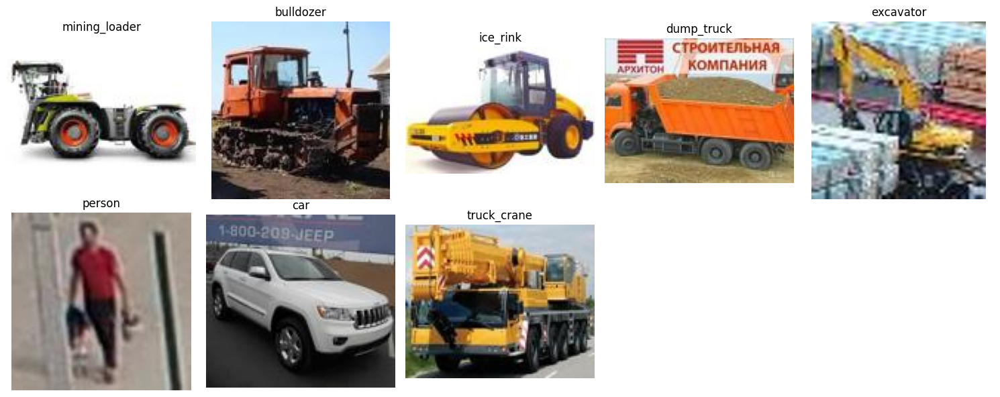

🎲 Показано по 1 случайному изображению из 8 категорий


In [4]:
# Показано по 1 случайному изображению из каждой категорий
from PIL import Image
import os
import matplotlib.pyplot as plt
import random

# Создаем график 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

categories = os.listdir(IMAGE_PATH)
plot_index = 0

for category in categories:
    category_path = os.path.join(IMAGE_PATH, category)
    file_names = os.listdir(category_path)
    
    # Берем 1 случайное изображение из каждой категории
    if file_names:
        random_file = random.choice(file_names)
        img_path = os.path.join(category_path, random_file)
        img = Image.open(img_path)
        
        axes[plot_index].imshow(img)
        axes[plot_index].set_title(f"{category}", fontsize=12)
        axes[plot_index].axis('off')
        plot_index += 1

# Скрываем лишние subplot'ы
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"🎲 Показано по 1 случайному изображению из {plot_index} категорий")

📊 АНАЛИЗ ДАТАСЕТА:
  bulldozer: 194 файлов
  car: 1586 файлов
  dump_truck: 797 файлов
  excavator: 316 файлов
  ice_rink: 293 файлов
  mining_loader: 514 файлов
  person: 969 файлов
  truck_crane: 321 файлов
📈 ИТОГО: 4990 изображений, 8 классов


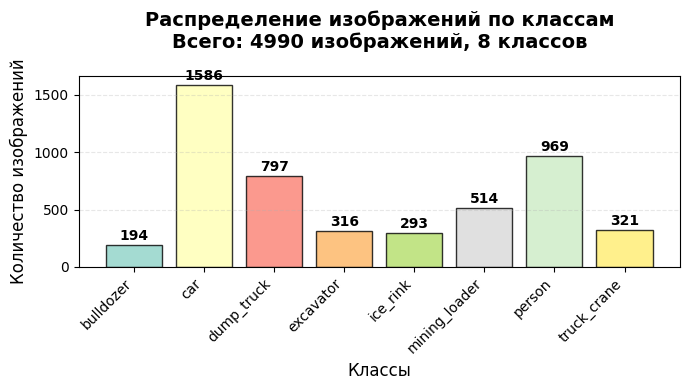

In [6]:
# Простой анализ датасета с визуализацией

import os
import matplotlib.pyplot as plt
import numpy as np

def analyze_dataset_simple(dataset_path):
    """
    Простой анализ датасета с визуализацией
    """
    # Проверяем существование пути
    if not os.path.exists(dataset_path):
        print(f"❌ Ошибка: путь '{dataset_path}' не существует")
        return None
    
    # Получаем список классов
    class_names = [d for d in os.listdir(dataset_path) 
                  if os.path.isdir(os.path.join(dataset_path, d))]
    class_names.sort()
    
    if not class_names:
        print("❌ В датасете не найдено папок с классами")
        return None
    
    # Подсчет файлов
    class_counts = {}
    total_files = 0
    
    print("📊 АНАЛИЗ ДАТАСЕТА:")
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        image_files = [f for f in os.listdir(class_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        count = len(image_files)
        class_counts[class_name] = count
        total_files += count
        print(f"  {class_name}: {count} файлов")
    
    print(f"📈 ИТОГО: {total_files} изображений, {len(class_names)} классов")
    
    # Визуализация
    plt.figure(figsize=(7, 4))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    # Создаем диаграмму
    bars = plt.bar(classes, counts, color=plt.cm.Set3(np.linspace(0, 1, len(classes))), 
                   edgecolor='black', alpha=0.8)
    
    # Настройки графика
    plt.title(f'Распределение изображений по классам\nВсего: {total_files} изображений, {len(class_names)} классов', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Классы', fontsize=12)
    plt.ylabel('Количество изображений', fontsize=12)
    
    # Поворачиваем подписи и выравниваем
    plt.xticks(rotation=45, ha='right')
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + max(counts)*0.01,
                f'{count}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    # Добавляем сетку для удобства чтения
    plt.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    # Настраиваем отступы
    plt.tight_layout()
    
    plt.show()
    
    return {'class_names': class_names, 'class_counts': class_counts, 'total_files': total_files}

# ИСПОЛЬЗОВАНИЕ:
# Просто вызовите функцию с путем к вашему датасету
result = analyze_dataset_simple(IMAGE_PATH)

In [7]:
# ✅ ПРАВИЛЬНЫЙ способ загрузки для AutoKeras

import tensorflow as tf
from tensorflow.keras.utils import image_dataset_from_directory
import autokeras as ak
import time
AUTOTUNE = tf.data.AUTOTUNE

batch_size = 64



train_data, validation_data = image_dataset_from_directory(
    IMAGE_PATH,
    label_mode='categorical',
    validation_split=0.2,
    subset='both',
    seed=123,
    image_size=(224, 224),
    batch_size=batch_size
)

# Минимальная проверка
CLASS_NAMES = train_data.class_names  # ✅ У tf.data.Dataset ЕСТЬ class_names!
CLASS_COUNT = len(CLASS_NAMES)

#AUTOTUNE = tf.data.AUTOTUNE
train_data = train_data.cache().prefetch(AUTOTUNE)
validation_data = validation_data.cache().prefetch(AUTOTUNE)



print(f"🏷️  Классы: {CLASS_NAMES}")
print(f"🔢 Количество классов: {CLASS_COUNT}")

# Проверка одного батча
for images, labels in train_data.take(1):
    print(f"📐 Батч: {images.shape}, метки: {labels.shape}")
    break

AttributeError: module 'numpy' has no attribute 'dtypes'

In [9]:
import tensorflow as tf

height, width = 224, 224
batch_size=16

train_data = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    subset="training",
    validation_split=0.2,
    seed=42,
    #label_mode='categorical',
    #label_mode='int',
    image_size=(height, width),  # Уменьшенный размер изображений
    batch_size=batch_size,  # Уменьшенный размер батча
    shuffle=True  # Перемешивание данных
)

validation_data = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    subset="validation",
    validation_split=0.2,
    seed=42,
    #label_mode='int',
    #label_mode='categorical',
    image_size=(height, width),  # Уменьшенный размер изображений
    batch_size=batch_size,  # Уменьшенный размер батча
    #shuffle=False
    shuffle=True  # Перемешивание данных
)

# Проверка количества изображений в каждой поддиректории
class_counts = {}
for class_name in os.listdir(IMAGE_PATH):
    class_path = os.path.join(IMAGE_PATH, class_name)
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))])


print("Class counts:", class_counts)

# Оптимизация потока данных
#train_data = train_data.cache().prefetch(buffer_size=1)
#validation_data = validation_data.cache().prefetch(buffer_size=1)
train_data = train_data.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
validation_data = validation_data.cache().prefetch(buffer_size=tf.data.AUTOTUNE)


# Проверка формата меток на обучающих данных
for images, labels in train_data.take(1):
    print("Формат меток (train):", labels.shape, labels.dtype)
    print("Пример меток (train):", labels.numpy())
#Тема #17. Классификация изображений на AutoKeras


# Проверка формата меток на валидационных данных
for images, labels in validation_data.take(1):
    print("Формат меток (validation):", labels.shape, labels.dtype)
    print("Пример меток (validation):", labels.numpy())

# Определение списка имен классов
CLASS_LIST = sorted(os.listdir(IMAGE_PATH))

# Определение количества классов
CLASS_COUNT = len(CLASS_LIST)

# Проверка результата
#print(f'Количество классов: {CLASS_COUNT}, метки классов: {CLASS_LIST}')

AttributeError: module 'numpy' has no attribute 'dtypes'

In [13]:
# Посмотреть размер одного батча
for images, labels in train_data.take(1):
    print("Форма одного батча:", images.shape)
    print("Размер одного батча в MiB:",
          tf.size(images).numpy() * 4 / (1024 ** 2), "MiB")

Форма одного батча: (16, 224, 224, 3)
Размер одного батча в MiB: 9.1875 MiB


2025-10-21 12:06:42.895996: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [14]:
# Проверим реальное состояние данных
images, labels = next(iter(train_data))
print("🔍 Реальные данные:")
print(f"  Диапазон изображений: {images.numpy().min():.3f} - {images.numpy().max():.3f}")
print(f"  Тип данных: {images.dtype}")
print(f"  Форма labels: {labels.shape}")
print(f"  Пример labels: {labels.numpy()[0]}")

🔍 Реальные данные:
  Диапазон изображений: 0.000 - 255.000
  Тип данных: <dtype: 'float32'>
  Форма labels: (16, 8)
  Пример labels: [0. 0. 0. 0. 0. 0. 0. 1.]


2025-10-21 12:06:48.631509: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


2025-10-21 12:06:56.792969: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


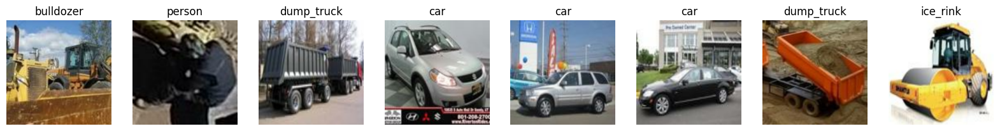

2025-10-21 12:06:57.040889: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


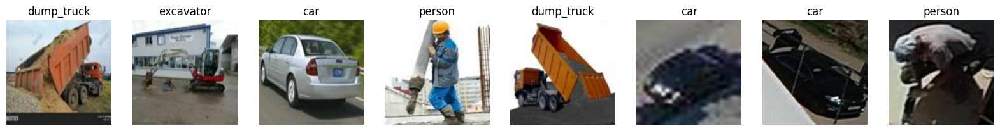

In [15]:
import matplotlib.pyplot as plt
import numpy as np
# Функция для визуализации изображений
def visualize_images(dataset, class_list, num_images=8):
    images, labels = next(iter(dataset))
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    for i in range(num_images):
        ax = axes[i]
        ax.imshow(images[i].numpy().astype('uint8'))
        ax.set_title(class_list[np.argmax(labels[i].numpy())])
        ax.axis('off')
    plt.show()

# Визуализация изображений из обучающей выборки
visualize_images(train_data, CLASS_LIST)

# Визуализация изображений из валидационной выборки
visualize_images(validation_data, CLASS_LIST)

In [10]:
# Добавьте для диагностики
import time

print("🧪 ТЕСТ ПРОИЗВОДИТЕЛЬНОСТИ...")
start_time = time.time()

# Тест скорости одного батча
for i, (images, labels) in enumerate(train_data.take(10)):
    if i == 0:
        batch_time = time.time() - start_time
        print(f"⏱️ Первый батч: {batch_time:.2f} сек")
    
print(f"⏱️ 10 батчей: {time.time() - start_time:.2f} сек")

# Идеальные показатели:
# - Первый батч: 0.5-2 сек (из-за кэширования)
# - Последующие: 0.1-0.5 сек на батч

🧪 ТЕСТ ПРОИЗВОДИТЕЛЬНОСТИ...
⏱️ Первый батч: 0.02 сек
⏱️ 10 батчей: 0.12 сек


2025-10-21 09:16:30.452127: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [11]:
# ДОБАВЬТЕ ЭТО ДЛЯ ДИАГНОСТИКИ
print("🔍 ДИАГНОСТИКА AUTOKERAS...")
print(f"Количество батчей в train_data: {len(list(train_data))}")
print(f"Количество батчей в validation_data: {len(list(validation_data))}")

# Проверим, что данные загружаются
sample_batch = next(iter(train_data))
print(f"Размер батча: {sample_batch[0].shape}")
print(f"Размер меток: {sample_batch[1].shape}")

🔍 ДИАГНОСТИКА AUTOKERAS...
Количество батчей в train_data: 250
Количество батчей в validation_data: 63
Размер батча: (16, 224, 224, 3)
Размер меток: (16,)


In [5]:
# Для tf.data.Dataset проверяем по-другому:

# 1. Посмотрим на структуру dataset
print("Структура train_data:", train_data.element_spec)

# 2. Посмотрим на один батч
for images, labels in train_data.take(1):
    print("Форма images:", images.shape)
    print("Форма labels:", labels.shape)
    print("Тип labels:", labels.dtype)
    print("Примеры labels:", labels.numpy()[:10])
    break

Структура train_data: (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))
Форма images: (16, 224, 224, 3)
Форма labels: (16,)
Тип labels: <dtype: 'int32'>
Примеры labels: [1 4 2 6 1 2 1 0 1 5]


2025-10-21 12:36:01.879581: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [9]:
# 2. Autokeras

import gc
import os
import autokeras as ak
from autokeras import ImageClassifier
from tensorflow.keras import backend as K
import warnings
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import numpy as np


os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit_disabled'
# Сборка мусора
gc.collect()

# Подавление предупреждений
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
warnings.filterwarnings("ignore")

'''
clf = ak.ImageClassifier(
    max_trials = 2,  # количество попыток для поиска оптимальной модели. AutoKeras протестирует 4 различные модели.
    objective ='val_accuracy',  # Целевая метрика, которую AutoKeras будет пытаться максимизировать во время поиска. Здесь используется точность на валидационном наборе данных.
    directory ='test_1',  # Директория, где AutoKeras будет сохранять промежуточные результаты. Используется для удобства и возможности повторного использования моделей.
    num_classes = CLASS_COUNT,
    overwrite=True,  # Если True, AutoKeras перезапишет предыдущие результаты в указанной директории, позволяя начать процесс поиска с чистого листа.
    #tuner = "hyperband", #⬅️ Самый быстрый и эффективный
    tuner="bayesian",
    #tuner='greedy',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
    seed = 123,
)

history = clf.fit(
    train_data,
    epochs=2,
    validation_data=validation_data,
    verbose=1,  # Рекомендуется для AutoKeras
    #callbacks=callbacks
)
'''

# 1. Сначала ВЫЧИСЛИТЕ class_weight_dict
print("🔍 Вычисляю веса классов для балансировки...")

# # Соберем все метки из train_data
# all_labels = []
# for _, labels in train_data:
#     all_labels.extend(labels.numpy())
#     if len(all_labels) > 2000:  # ограничим для скорости
#         break

# all_labels = np.array(all_labels)

#----------------------------------------------------------------------------------------------
# Вычислим веса классов
# from sklearn.utils.class_weight import compute_class_weight

# class_weights = compute_class_weight(
#     'balanced',
#     classes=np.unique(all_labels),
#     y=all_labels
# )
# class_weight_dict = dict(enumerate(class_weights))

# print("📊 Веса классов для балансировки:")
# for i, weight in enumerate(class_weights):
#     class_names = ['bulldozer', 'car', 'dump_truck', 'excavator', 
#                    'ice_rink', 'mining_loader', 'person', 'truck_crane']
#     print(f"  {class_names[i]}: {weight:.2f}")
#--------------------------------------------------------------------------------------------------

# -----CALLBACK НЕ ПОДДЕРЖИВАЮТСЯ В ImageClassifier----- 

# 
clf = ak.ImageClassifier(
    max_trials=10,
    objective='val_accuracy',  # Целевая метрика, которую AutoKeras будет пытаться максимизировать во время поиска. Здесь используется точность на валидационном наборе данных.
    metrics=['accuracy'],
    directory='test_1',
    num_classes=CLASS_COUNT,
    overwrite=True,
    #tuner='greedy', # ← Более тщательный поиск
    #tuner="bayesian",
    tuner = "hyperband", # Hyperband сам увеличит количество эпох для лучших моделей! Процесс идет правильно! 🚀
    seed=123,
)

history = clf.fit(
    train_data,
    epochs=10, 
    validation_data=validation_data,
    #class_weight=class_weight_dict,  # ← ДОБАВЬТЕ ЭТО для баланса классов
    verbose=1
)


# Полная очистка сессий TensorFlow
# K.clear_session()
# tf.keras.backend.clear_session()
# tf.compat.v1.reset_default_graph()

# Сборка мусора
#gc.collect() 

Trial 10 Complete [00h 00m 30s]
val_accuracy: 0.37374749779701233

Best val_accuracy So Far: 0.914829671382904
Total elapsed time: 00h 09m 47s
Epoch 1/10
249/250 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.5304 - loss: 1.4175

2025-10-21 12:50:07.982902: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_add_reduce_fusion_3', 4 bytes spill stores, 4 bytes spill loads



250/250 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - accuracy: 0.6736 - loss: 1.0609 - val_accuracy: 0.8828 - val_loss: 0.4780
Epoch 2/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.9216 - loss: 0.3792 - val_accuracy: 0.9218 - val_loss: 0.3207
Epoch 3/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - accuracy: 0.9744 - loss: 0.1921 - val_accuracy: 0.9359 - val_loss: 0.2594
Epoch 4/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.9922 - loss: 0.1137 - val_accuracy: 0.9409 - val_loss: 0.2280
Epoch 5/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.9975 - loss: 0.0748 - val_accuracy: 0.9439 - val_loss: 0.2092
Epoch 6/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - accuracy: 0.9995 - loss: 0.0533 - val_accuracy: 0.9439 - val_loss: 0.1969
Epoch 7/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9995 - loss: 0.0404 - val_accuracy: 0.9439 - val_loss: 0.1880
Epoch 8/10
250/250 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.9997 - loss: 0.0320 - val_accura

In [ ]:
# Как посмотреть все испытанные модели:

import autokeras as ak
import tensorflow as tf

# Обучаем как обычно
#clf = ak.ImageClassifier(max_trials=5, directory='test_1', overwrite=True)
#history = clf.fit(train_data, epochs=10, validation_data=validation_data)

# 🔍 ПОСМОТРЕТЬ ВСЕ TRIALS
print("📊 Все испытания (trials):")
for i, trial in enumerate(clf.tuner.oracle.get_best_trials(5)):
    print(f"\nTrial {i+1}:")
    print(f"  Score: {trial.score:.4f}")
    print(f"  Status: {trial.status}")
    print(f"  Hyperparameters: {trial.hyperparameters.values}")

In [10]:
# 🏆 ЛУЧШАЯ МОДЕЛЬ
best_model = clf.tuner.oracle.get_best_trials(1)[0]
print(f"\n🎯 Лучший trial:")
print(f"  Score: {best_model.score:.4f}")
print(f"  Hyperparameters: {best_model.hyperparameters.values}")


🎯 Лучший trial:
  Score: 0.9148
  Hyperparameters: {'image_block_1/normalize': True, 'image_block_1/augment': False, 'image_block_1/block_type': 'resnet', 'image_block_1/res_net_block_1/pretrained': True, 'image_block_1/res_net_block_1/version': 'resnet101_v2', 'image_block_1/res_net_block_1/imagenet_size': True, 'classification_head_1/spatial_reduction_1/reduction_type': 'global_avg', 'classification_head_1/dropout': 0.0, 'optimizer': 'sgd', 'learning_rate': 0.001, 'image_block_1/res_net_block_1/trainable': True, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 6, 'tuner/round': 0}


In [14]:
# метки INT

est_model = clf.export_model()

# ПЕРЕКОМПИЛИРУЕМ для integer меток
best_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ← ДЛЯ INTEGER МЕТОК!
    metrics=['accuracy']
)

print("✅ Модель перекомпилирована для integer меток")

# проверяем модель на тестовой выборке
loss, accuracy = best_model.evaluate(validation_data, batch_size=32, verbose=1)

# Выводим результаты оценки модели
print(f'Loss: {loss}')
print(f'Accuracy: {accuracy}')

✅ Модель перекомпилирована для integer меток
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.9148 - loss: 0.3252
Loss: 0.3252370357513428
Accuracy: 0.914829671382904


In [11]:
# метки ONE-HOT

best_model = clf.export_model()
#best_model.save('ImClass_best_model_.keras')

# проверяем модель на тестовой выборке
loss, accuracy = best_model.evaluate(validation_data, batch_size=32, verbose=1)

# Выводим результаты оценки модели
print(f'Loss: {loss}')
print(f'Accuracy: {accuracy}')

best_model.summary()

# Создаем имя файла с динамической вставкой точности
file_name = f"keras_autokeras_{accuracy:.4f}.keras"
# Сохраняем модель
best_model.save(file_name)

ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 8)

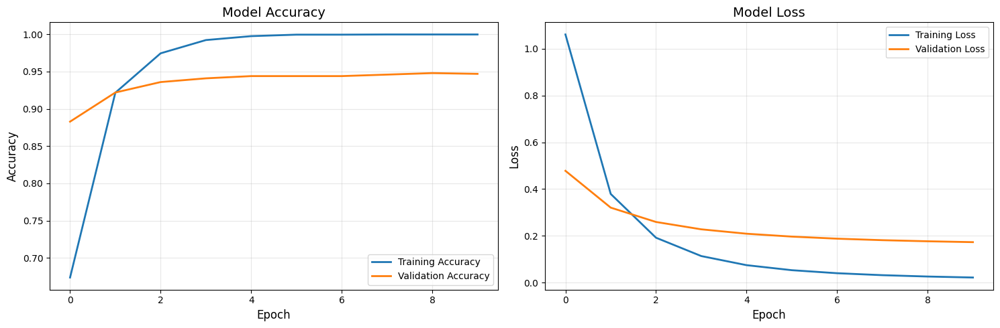

In [16]:
# Визуализация результатов

import matplotlib.pyplot as plt
import numpy as np

#history = final_history

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)

🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...
📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...
🔄 Получаем предсказания...
🔄 Собираем предсказания и метки...
📦 Обработано батчей: 10
📦 Обработано батчей: 20
📦 Обработано батчей: 30
📦 Обработано батчей: 40
📦 Обработано батчей: 50
📦 Обработано батчей: 60
✅ Собрано 998 предсказаний
🔢 Уникальные истинные классы: [0 1 2 3 4 5 6 7]
🔢 Уникальные предсказанные классы: [0 1 2 3 4 5 6 7]
📋 Присутствующие классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
📏 Confusion matrix shape: (8, 8)


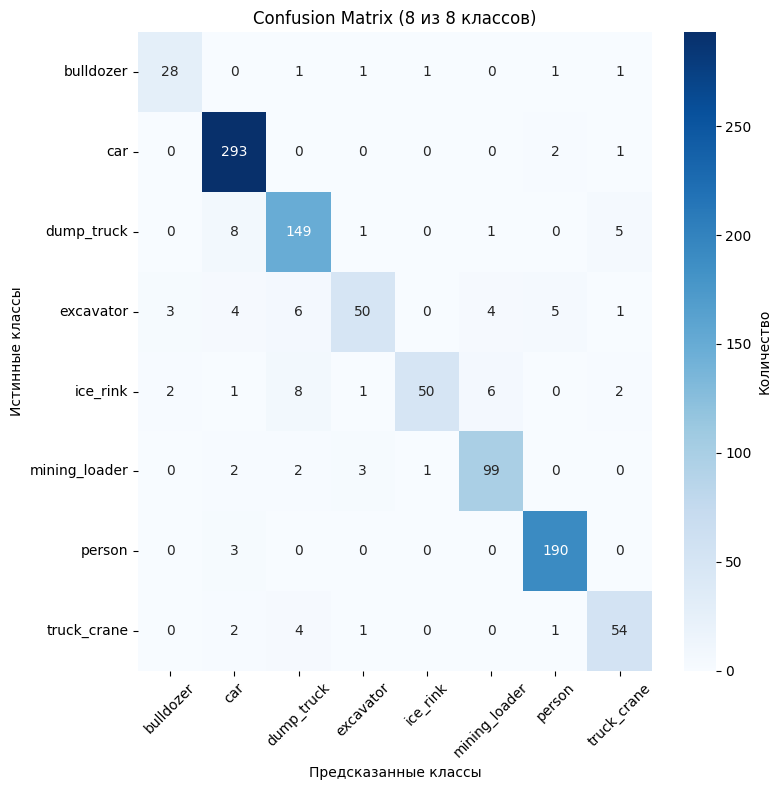


📈 ДЕТАЛЬНАЯ СТАТИСТИКА:
Всего примеров: 998
Общая точность: 0.9148

🎯 ТОЧНОСТЬ ПО КЛАССАМ:
  bulldozer: 0.8485 (28/33)
  car: 0.9899 (293/296)
  dump_truck: 0.9085 (149/164)
  excavator: 0.6849 (50/73)
  ice_rink: 0.7143 (50/70)
  mining_loader: 0.9252 (99/107)
  person: 0.9845 (190/193)
  truck_crane: 0.8710 (54/62)

📊 CLASSIFICATION REPORT:
               precision    recall  f1-score   support

    bulldozer     0.8485    0.8485    0.8485        33
          car     0.9361    0.9899    0.9622       296
   dump_truck     0.8765    0.9085    0.8922       164
    excavator     0.8772    0.6849    0.7692        73
     ice_rink     0.9615    0.7143    0.8197        70
mining_loader     0.9000    0.9252    0.9124       107
       person     0.9548    0.9845    0.9694       193
  truck_crane     0.8438    0.8710    0.8571        62

     accuracy                         0.9148       998
    macro avg     0.8998    0.8658    0.8789       998
 weighted avg     0.9149    0.9148    0.9124   

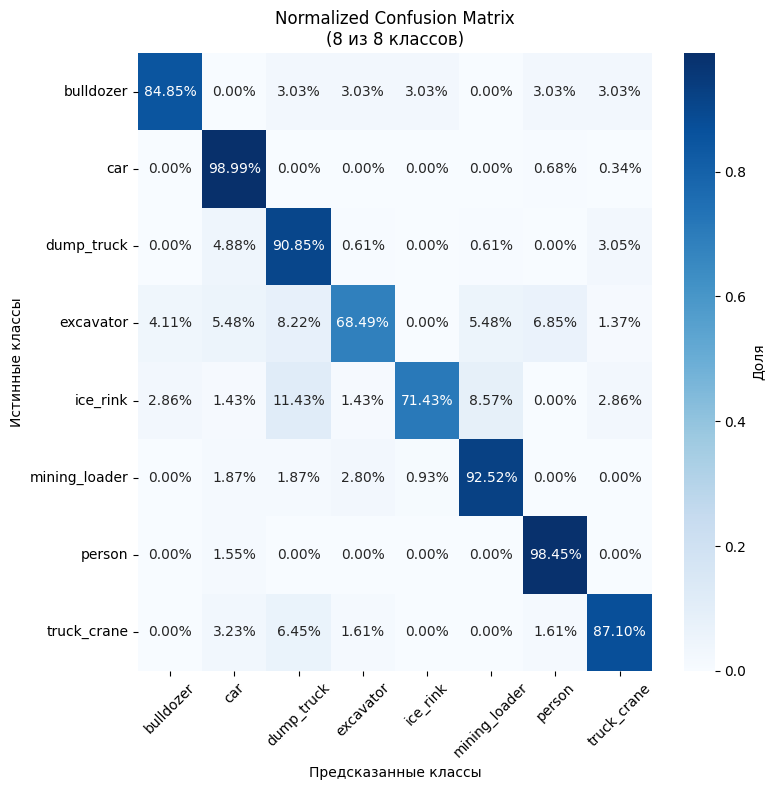

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf

#history = final_history

'''
Синие тона:
cmap='Blues' # твой текущий
cmap='viridis' 
cmap='coolwarm'
cmap='icefire'

Зеленые тона:
cmap='Greens'
cmap='viridis'
cmap='summer'

Красные/оранжевые:
cmap='Reds'
cmap='Oranges'
cmap='YlOrBr'  
cmap='hot'

Фиолетовые:
cmap='Purples'
cmap='magma'
cmap='plasma'
'''


def get_all_predictions_modern(model, dataset):
    """Получает все предсказания и метки из датасета"""
    print("🔄 Собираем предсказания и метки...")
    
    all_preds = []
    all_true_labels = []
    
    # Проходим по всем батчам датасета
    for batch_idx, (images, labels) in enumerate(dataset):
        # Получаем предсказания для текущего батча
        batch_preds = model.predict(images, verbose=0)
        all_preds.append(batch_preds)
        all_true_labels.append(labels.numpy())
        
        # Прогресс каждые 10 батчей
        if (batch_idx + 1) % 10 == 0:
            print(f"📦 Обработано батчей: {batch_idx + 1}")
    
    # Объединяем все батчи
    all_preds = np.concatenate(all_preds, axis=0)
    all_true_labels = np.concatenate(all_true_labels, axis=0)
    
    print(f"✅ Собрано {len(all_preds)} предсказаний")
    return all_preds, all_true_labels

def safe_confusion_matrix_analysis(model, dataset, class_names):
    """Безопасный анализ confusion matrix с автоматической обработкой отсутствующих классов"""
    print("📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...")
    
    # Получаем предсказания
    print("🔄 Получаем предсказания...")
    preds, true_labels = get_all_predictions_modern(model, dataset)
    
    # Для sparse categorical - метки уже целые числа, не нужно argmax
    if len(true_labels.shape) == 1:  # sparse labels [0, 1, 2, ...]
        true_classes = true_labels
    else:  # one-hot encoded labels
        true_classes = np.argmax(true_labels, axis=1)
    
    preds_classes = np.argmax(preds, axis=1)
    
    # Находим какие классы реально присутствуют в данных
    present_true_classes = np.unique(true_classes)
    present_pred_classes = np.unique(preds_classes)
    
    print(f"🔢 Уникальные истинные классы: {present_true_classes}")
    print(f"🔢 Уникальные предсказанные классы: {present_pred_classes}")
    
    # Определяем какие классы из class_names реально присутствуют
    present_class_indices = sorted(present_true_classes)
    present_class_names = [class_names[i] for i in present_class_indices]
    
    print(f"📋 Присутствующие классы: {present_class_names}")
    
    absent_classes = [class_names[i] for i in range(len(class_names)) if i not in present_true_classes]
    if absent_classes:
        print(f"❌ Отсутствующие классы: {absent_classes}")
    
    # Создаем confusion matrix только для присутствующих классов
    cm = confusion_matrix(true_classes, preds_classes, labels=present_class_indices)
    
    print(f"📏 Confusion matrix shape: {cm.shape}")
    
    # Визуализируем
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Количество'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Confusion Matrix ({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # Статистика
    total_samples = len(true_classes)
    accuracy = np.sum(preds_classes == true_classes) / total_samples
    
    print(f"\n📈 ДЕТАЛЬНАЯ СТАТИСТИКА:")
    print(f"Всего примеров: {total_samples}")
    print(f"Общая точность: {accuracy:.4f}")
    
    print(f"\n🎯 ТОЧНОСТЬ ПО КЛАССАМ:")
    for i, class_idx in enumerate(present_class_indices):
        class_name = class_names[class_idx]
        correct = cm[i, i]
        total = np.sum(cm[i, :])
        accuracy = correct / total if total > 0 else 0
        print(f"  {class_name}: {accuracy:.4f} ({correct}/{total})")
    
    # Для отсутствующих классов
    if absent_classes:
        print(f"\n❌ ОТСУТСТВУЮЩИЕ КЛАССЫ В ВАЛИДАЦИИ:")
        for class_name in absent_classes:
            print(f"  {class_name}: 0 примеров")
    
    # Classification report только для присутствующих классов
    print(f"\n📊 CLASSIFICATION REPORT:")
    print(classification_report(true_classes, preds_classes, 
                              labels=present_class_indices,
                              target_names=present_class_names, 
                              digits=4))
    
    # Нормализованная confusion matrix
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)  # Заменяем NaN на 0
    
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Blues',
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Доля'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Normalized Confusion Matrix\n({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    return cm, present_class_names

# 🎯 ЗАПУСКАЕМ АНАЛИЗ
print("🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...")
cm, present_classes = safe_confusion_matrix_analysis(best_model, validation_data, CLASS_LIST)

🎲 Тестирование случайных примеров...


2025-10-21 13:05:23.917753: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2959', 8 bytes spill stores, 8 bytes spill loads

2025-10-21 13:05:24.040097: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2959', 532 bytes spill stores, 532 bytes spill loads



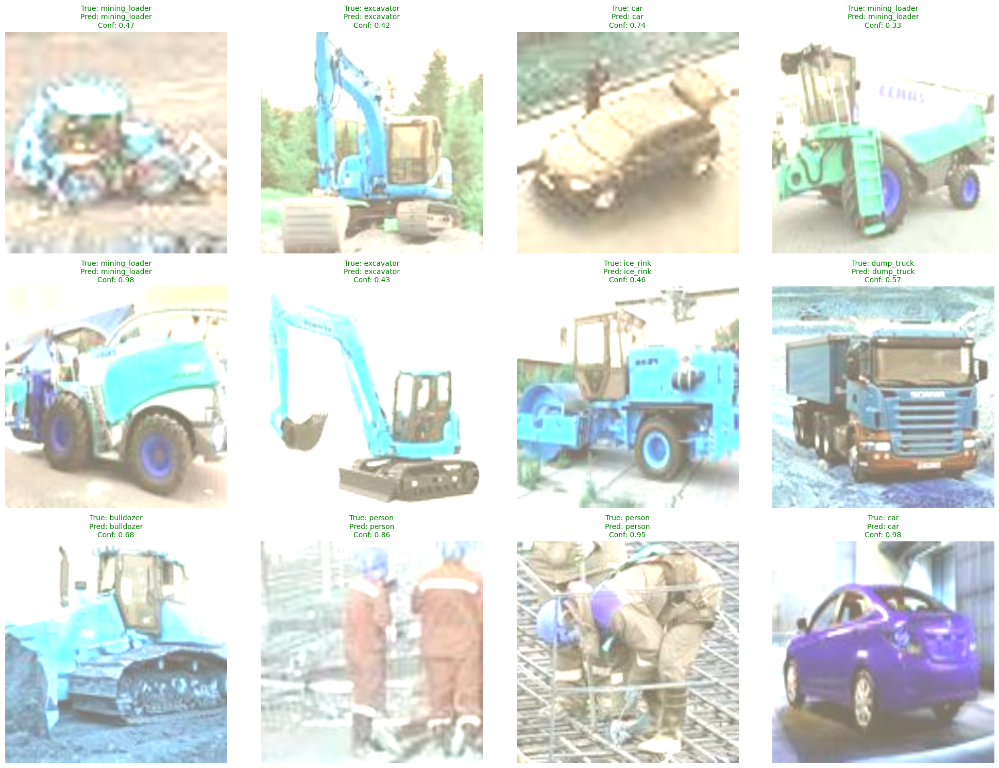

📊 Точность на 12 случайных примерах: 12/12 (100.0%)


In [19]:
# рандом ВЕРСИЯ ДЛЯ SPARSE LABELS 

def test_random_predictions_modern(model, dataset, class_names, num_samples=12):
    """
    Тестирование случайных примеров из всего датасета
    ВЕРСИЯ ДЛЯ SPARSE LABELS (целочисленные метки)
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    # Объединяем все батчи
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # ДЛЯ SPARSE LABELS - просто используем как есть, без argmax!
    true_classes = selected_labels  # ← ИСПРАВЛЕНИЕ ЗДЕСЬ
    
    # Создаем сетку
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif rows > 1 and cols == 1:
        axes = axes.reshape(-1, 1)
    
    correct = 0
    for i, idx in enumerate(indices):
        if rows == 1:
            ax = axes[col] if cols > 1 else axes
        else:
            row_idx = i // cols
            col_idx = i % cols
            ax = axes[row_idx, col_idx]
        
        # Денормализация для ResNet50
        image = selected_images[i].copy()
        image[..., 0] += 103.939
        image[..., 1] += 116.779  
        image[..., 2] += 123.68
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        if rows == 1:
            if cols > 1:
                axes[i].axis('off')
        else:
            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    
    return correct, accuracy

# Использование случайных примеров:
print("🎲 Тестирование случайных примеров...")
correct, accuracy = test_random_predictions_modern(best_model, validation_data, CLASS_LIST, num_samples=12)

🎲 Тестирование случайных примеров (универсальная версия)...


2025-10-21 13:05:01.893989: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2959', 580 bytes spill stores, 580 bytes spill loads

2025-10-21 13:05:01.939425: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2959', 716 bytes spill stores, 716 bytes spill loads



🔍 Обнаружен формат меток: SPARSE


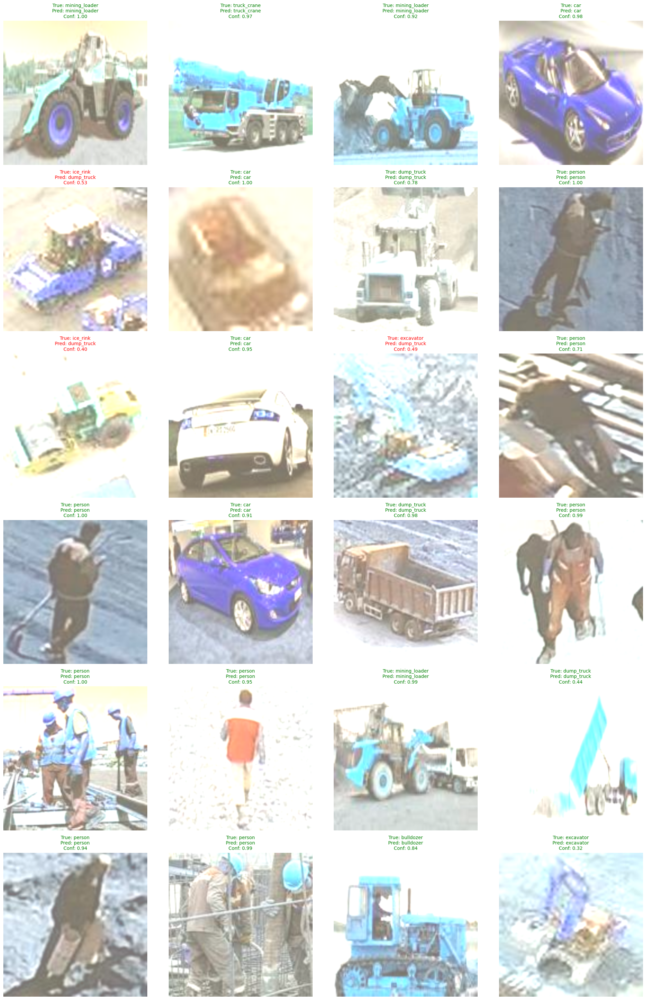

📊 Точность на 24 случайных примерах: 21/24 (87.5%)
🎯 Формат меток: SPARSE


In [18]:
# рандом УНИВЕРСАЛЬНАЯ ВЕРСИЯ (работает с любым форматом)

def test_random_predictions_universal(model, dataset, class_names, num_samples=12):
    """
    Универсальная версия для любого формата меток
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # АВТОМАТИЧЕСКОЕ ОПРЕДЕЛЕНИЕ ФОРМАТА МЕТОК
    if len(selected_labels.shape) == 1:  # SPARSE labels
        true_classes = selected_labels
        label_format = "SPARSE"
    else:  # ONE-HOT labels
        true_classes = np.argmax(selected_labels, axis=1)
        label_format = "ONE-HOT"
    
    print(f"🔍 Обнаружен формат меток: {label_format}")
    
    # Создаем сетку
    cols = 4
    rows = (len(indices) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    correct = 0
    for i, idx in enumerate(indices):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        
        # Умная денормализация
        image = selected_images[i].copy()
        
        # Автоматическое определение диапазона
        if image.min() >= -1 and image.max() <= 1:
            image = (image + 1) * 127.5
        elif image.min() >= 0 and image.max() <= 1:
            image = image * 255
        else:
            # ImageNet нормализация
            image[..., 0] += 103.939
            image[..., 1] += 116.779  
            image[..., 2] += 123.68
        
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        row = i // cols
        col = i % cols
        if rows > 1:
            axes[row, col].axis('off')
        else:
            axes[col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    print(f"🎯 Формат меток: {label_format}")
    
    return correct, accuracy

# Тестируем универсальную версию
print("🎲 Тестирование случайных примеров (универсальная версия)...")
correct, accuracy = test_random_predictions_universal(best_model, validation_data, CLASS_LIST, num_samples=24)

In [ ]:
# Сохраните модель

# Сохраняем обученную модель
model.save('cats_dogs_classifier.h5')
print("💾 Модель сохранена как 'cats_dogs_classifier.h5'")

# Или сохраняем только веса
model.save_weights('cats_dogs_weights.h5')
print("💾 Веса сохранены как 'cats_dogs_weights.h5'")

In [32]:
# Сохраняем в современном формате
model.save('best_model_scotp-2.keras')
print("💾 Модель сохранена как 'best_model_1.keras'")

💾 Модель сохранена как 'best_model_1.keras'
